--2024-03-28 04:26:40--  https://raw.githubusercontent.com/Hrushi11/Dogs_VS_Cats/main/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10139 (9.9K) [text/plain]
Saving to: ‘helper_functions.py.2’

helper_functions.py 100%[===================>]   9.90K  --.-KB/s    in 0s      

2024-03-28 04:26:40 (60.8 MB/s) - ‘helper_functions.py.2’ saved [10139/10139]



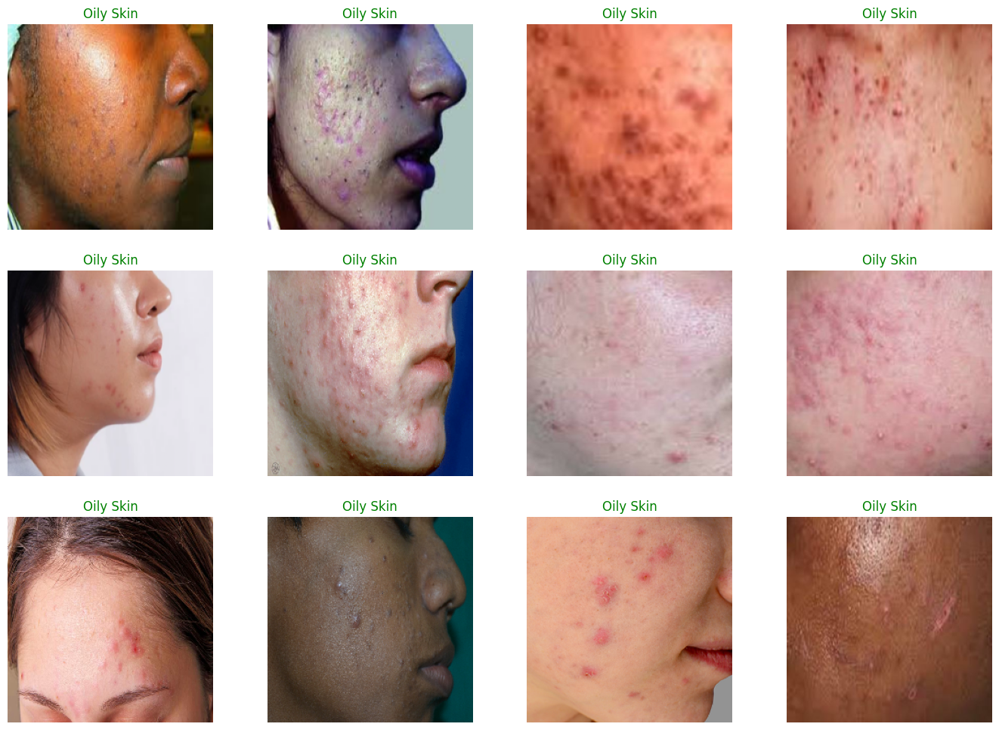

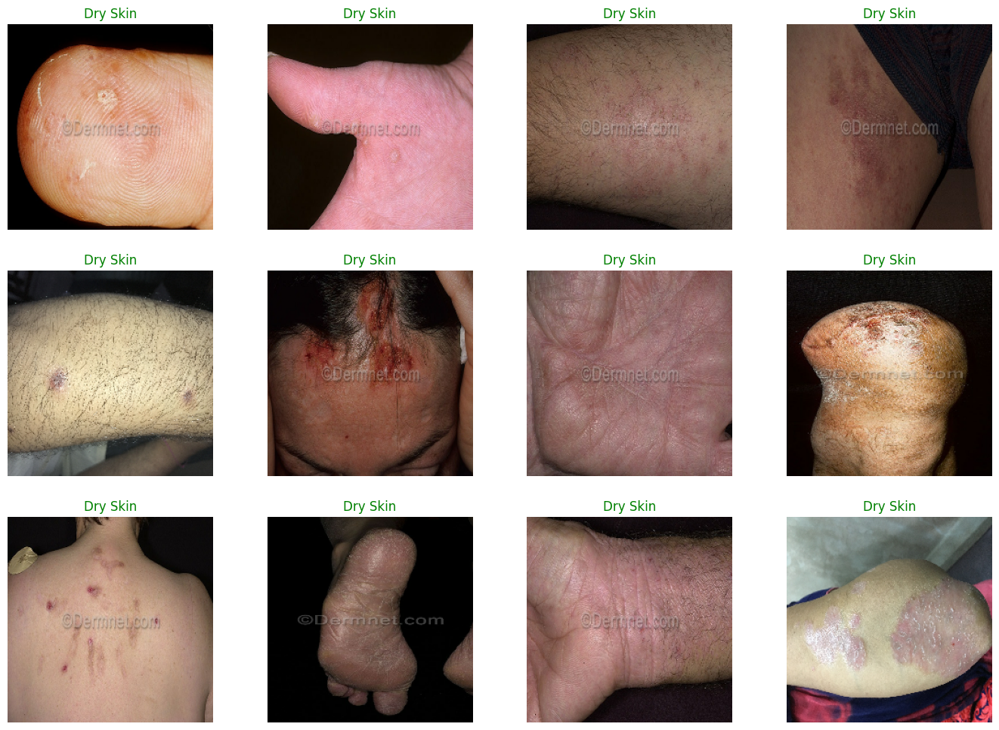

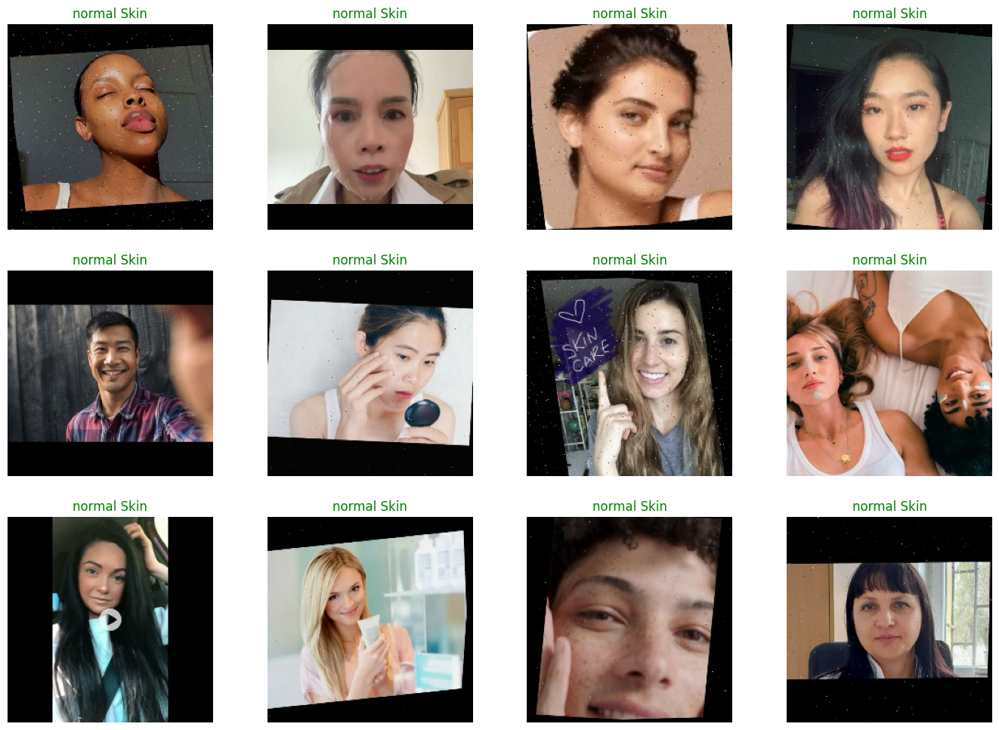

In [7]:
# downloading helper_functions.py
! wget https://raw.githubusercontent.com/Hrushi11/Dogs_VS_Cats/main/helper_functions.py

# Importing dependancies
import os
import random
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from os import listdir

from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from helper_functions import plot_loss_curves, compare_historys, make_confusion_matrix


# Setting dir paths
oil_dir = "/content/skin-dataset/oily"
dry_dir = "/content/skin-dataset/dry"
normal_dir = "/content/skin-dataset/normal"

# Getting all the paths in a list for oil and dry skins
oil_list = []
for path in os.listdir(oil_dir):
  oil_list.append(oil_dir + "/" + path)

dry_list = []
for path in os.listdir(dry_dir):
  dry_list.append(dry_dir + "/" + path)


normal_list = []
for path in os.listdir(normal_dir):
  normal_list.append(normal_dir + "/" + path)



# Preprocess img function
IMG_SIZE = (224, 224)
def load_and_prep(filepath):
  img_path = tf.io.read_file(filepath)
  img = tf.io.decode_image(img_path)
  img = tf.image.resize(img, IMG_SIZE)

  return img


# Getting only those images which are suitable
def corrImgs(arr):
  corrImgList = []
  for path in arr:
    img = load_and_prep(path)
    if (img.shape[2] == 3) | (img.shape == 4):
      corrImgList.append(path)

  return corrImgList



# Randomly plotting the Oily Skin images
random_oil_skin = np.random.choice(oil_list, size=12, replace=False)
plt.figure(figsize=(17, 12))
for i in range(12):
  img_path = random_oil_skin[i]
  img = load_and_prep(img_path)

  # plotting the images
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(img/255)
  plt.title("Oily Skin", color="green")



# Randomly plotting the Dry Skin images
random_dry_skin = np.random.choice(dry_list, size=12, replace=False)
plt.figure(figsize=(17, 12))
for i in range(12):
  img_path = random_dry_skin[i]
  img = load_and_prep(img_path)

  # plotting the images
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(img/255)
  plt.title("Dry Skin", color="green")



# Randomly plotting the normal Skin images
random_normal_skin = np.random.choice(normal_list, size=12, replace=False)
plt.figure(figsize=(17, 12))
for i in range(12):
  img_path = random_normal_skin[i]
  img = load_and_prep(img_path)

  # plotting the images
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(img/255)
  plt.title("normal Skin", color="green")


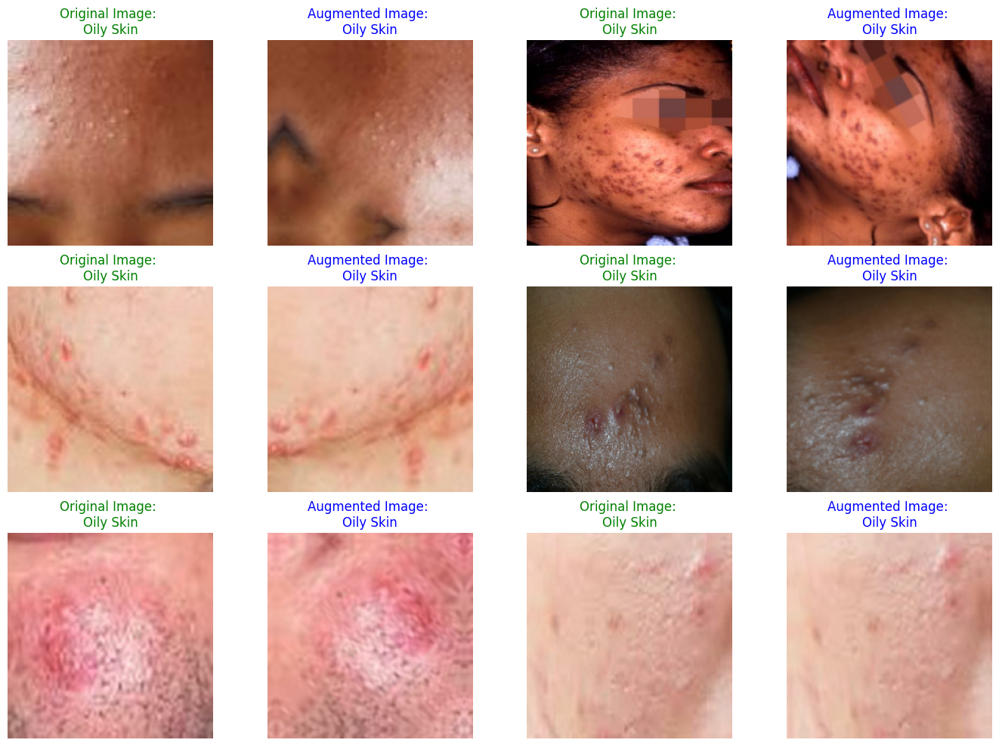

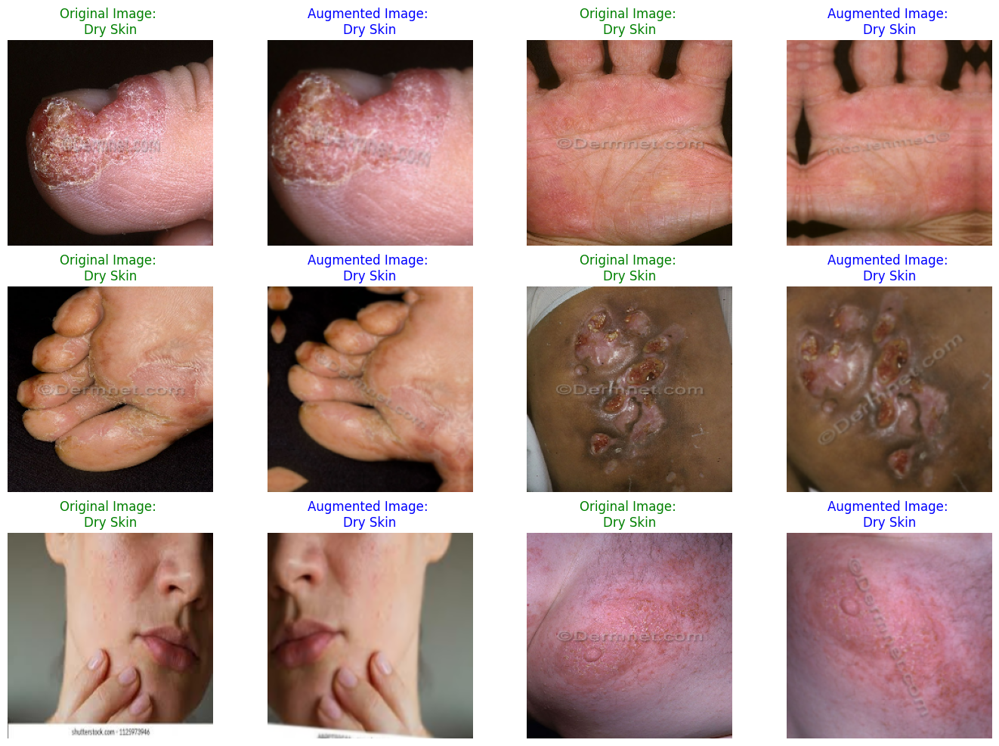

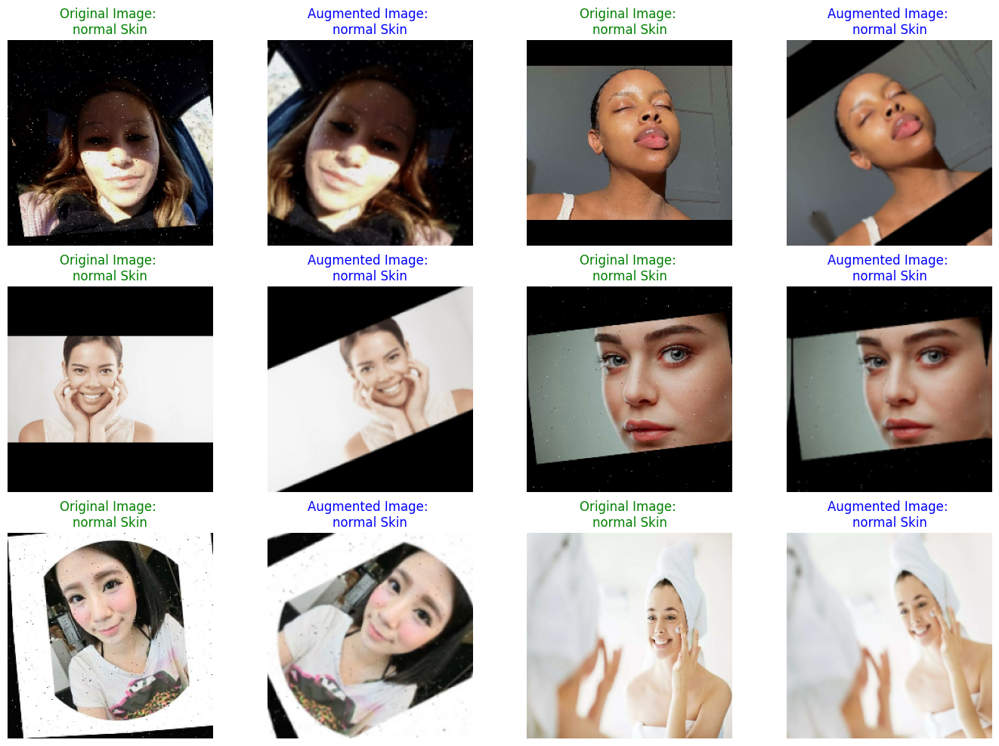

In [8]:
# Creating data augmentation layer
data_augmentation = tf.keras.Sequential([
   preprocessing.RandomFlip("horizontal"),
   preprocessing.RandomRotation(0.2),
   preprocessing.RandomZoom(0.2),
   preprocessing.RandomHeight(0.2),
  preprocessing.RandomWidth(0.2)
], name="data_augmentation_layer")

# Visualizing multiple randomly augmented oily skin images
plt.figure(figsize=(17, 12))
for i in range(1, 12, 2):
  random_class = "Oily Skin"
  random_img_path = random.choice(oil_list)

  img = load_and_prep(random_img_path)
  aug_img = data_augmentation(tf.expand_dims(img, axis=0))
  aug_img = tf.image.resize(aug_img[0], IMG_SIZE)

  # Plotting original image
  plt.subplot(3, 4, i)
  plt.axis(False)
  plt.imshow(img / 255)
  plt.title(f"Original Image: \n{random_class}", color="green")

  # Plotting augmented image
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(aug_img / 255)
  plt.title(f"Augmented Image: \n{random_class}", color="blue");


plt.figure(figsize=(17, 12))
for i in range(1, 12, 2):
  random_class = "Dry Skin"
  random_img_path = random.choice(dry_list)

  img = load_and_prep(random_img_path)
  aug_img = data_augmentation(tf.expand_dims(img, axis=0))
  aug_img = tf.image.resize(aug_img[0], IMG_SIZE)

  # Plotting original image
  plt.subplot(3, 4, i)
  plt.axis(False)
  plt.imshow(img / 255)
  plt.title(f"Original Image: \n{random_class}", color="green")

  # Plotting augmented image
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(aug_img / 255)
  plt.title(f"Augmented Image: \n{random_class}", color="blue");

# Visualizing multiple randomly augmented normal skin images
plt.figure(figsize=(17, 12))
for i in range(1, 12, 2):
  random_class = "normal Skin"
  random_img_path = random.choice(normal_list)

  img = load_and_prep(random_img_path)
  aug_img = data_augmentation(tf.expand_dims(img, axis=0))
  aug_img = tf.image.resize(aug_img[0], IMG_SIZE)

  # Plotting original image
  plt.subplot(3, 4, i)
  plt.axis(False)
  plt.imshow(img / 255)
  plt.title(f"Original Image: \n{random_class}", color="green")

  # Plotting augmented image
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(aug_img / 255)
  plt.title(f"Augmented Image: \n{random_class}", color="blue");



In [11]:
# Train test splits
subdirectories = [d for d in listdir("/content/skin-dataset") if d != '.ipynb_checkpoints']

data_gen = ImageDataGenerator(validation_split=0.2)

train_data = data_gen.flow_from_directory(directory="/content/skin-dataset" ,
                                          subset='training',
                                          target_size=IMG_SIZE,
                                          classes=subdirectories)

test_data = data_gen.flow_from_directory(directory="/content/skin-dataset",
                                         subset='validation',
                                         target_size=IMG_SIZE,
                                         classes=subdirectories)



print(test_data.labels.shape)
print(train_data.labels.shape)

print(test_data.class_indices)
print(train_data.class_indices)


len(train_data), len(test_data)


Found 944 images belonging to 3 classes.
Found 235 images belonging to 3 classes.
(235,)
(944,)
{'oily': 0, 'dry': 1, 'normal': 2}
{'oily': 0, 'dry': 1, 'normal': 2}


(30, 8)

16705208/16705208 [==============================] - 0s 0us/step
Epoch 1/5
30/30 [==============================] - 116s 4s/step - loss: 0.4840 - accuracy: 0.8167 - val_loss: 0.2329 - val_accuracy: 0.9062
Epoch 2/5
30/30 [==============================] - 95s 3s/step - loss: 0.1938 - accuracy: 0.9449 - val_loss: 0.2104 - val_accuracy: 0.9375
Epoch 3/5
30/30 [==============================] - 88s 3s/step - loss: 0.1535 - accuracy: 0.9629 - val_loss: 0.1432 - val_accuracy: 0.9375
Epoch 4/5
30/30 [==============================] - 90s 3s/step - loss: 0.1359 - accuracy: 0.9629 - val_loss: 0.1653 - val_accuracy: 0.9219
Epoch 5/5
8/8 [==============================] - 19s 2s/step - loss: 0.1352 - accuracy: 0.9574


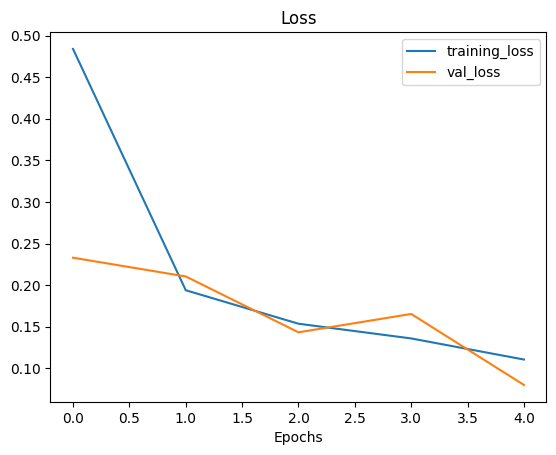

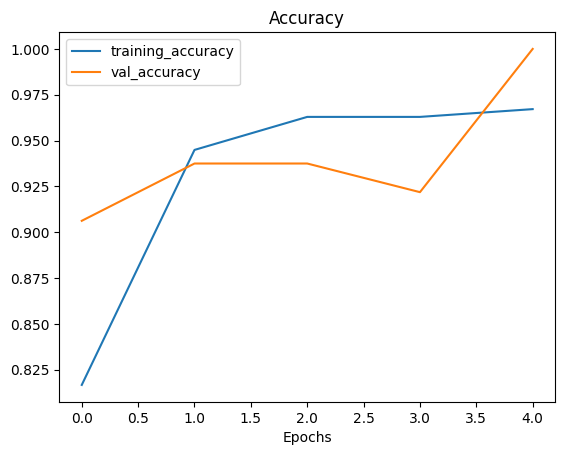

In [12]:
# Building the Model

# Setting up base model
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

# Setting up input layer
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_augmentation(inputs)
x = base_model(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling")(x)
outputs = tf.keras.layers.Dense(3, activation="softmax", name="output_layer")(x)
model_1 = tf.keras.Model(inputs, outputs)

# compiling the model
model_1.compile(loss=tf.keras.losses.categorical_crossentropy,
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

# fit the model
history_1 = model_1.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=0.25 * len(test_data))

#  Evaluating the model
model_1.evaluate(test_data)

# Plotting loss curves
plot_loss_curves(history_1)

Epoch 5/10
30/30 [==============================] - 116s 4s/step - loss: 0.0889 - accuracy: 0.9714 - val_loss: 0.0645 - val_accuracy: 0.9844
Epoch 6/10
30/30 [==============================] - 95s 3s/step - loss: 0.0732 - accuracy: 0.9746 - val_loss: 0.0833 - val_accuracy: 0.9688
Epoch 7/10
30/30 [==============================] - 104s 3s/step - loss: 0.0549 - accuracy: 0.9778 - val_loss: 0.0597 - val_accuracy: 0.9844
Epoch 8/10
30/30 [==============================] - 98s 3s/step - loss: 0.0524 - accuracy: 0.9852 - val_loss: 0.0824 - val_accuracy: 0.9844
Epoch 9/10
30/30 [==============================] - 107s 4s/step - loss: 0.0497 - accuracy: 0.9852 - val_loss: 0.0933 - val_accuracy: 0.9688
Epoch 10/10
30/30 [==============================] - 110s 4s/step - loss: 0.0492 - accuracy: 0.9820 - val_loss: 0.0316 - val_accuracy: 1.0000


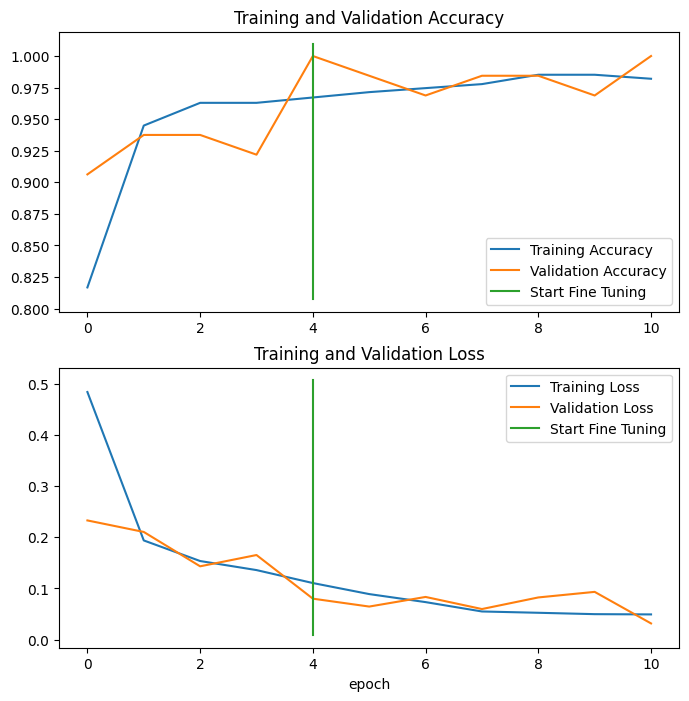

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, None   0         
 equential)                  )                                   
                                                                 
 efficientnetb0 (Functional  (None, None, None, 1280   4049571   
 )                           )                                   
                                                                 
 global_average_pooling (Gl  (None, 1280)              0         
 obalAveragePooling2D)                                           
                                                                 
 output_layer (Dense)        (None, 3)                 3843      
                                                             

In [13]:
# Unfreeze all of the layers in the base model
base_model.trainable = True

# Refreeze every layer except for the last 5
for layer in base_model.layers[:-5]:
  layer.trainable = False

# Recompile model with lower learning rate
model_1.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(1e-4),
                metrics=['accuracy'])

# Fine-tune for 5 more epochs
fine_tune_epochs = 10

history_1_fine_tune_1 = model_1.fit(train_data,
                                    epochs=fine_tune_epochs,
                                    validation_data=test_data,
                                    validation_steps= 0.25 * len(test_data),
                                    initial_epoch=history_1.epoch[-1])
compare_historys(history_1, history_1_fine_tune_1)
# Model summary
model_1.summary()
# Getting test image file paths
test_data_img_paths = test_data.filepaths
np.random.shuffle(test_data_img_paths)

# Getting labels
test_data_labels = []
for path in test_data_img_paths:
  test_data_labels.append(path.split("/")[3])

# Creating a dataframe of test paths
df_test_data_img_paths = pd.DataFrame({"Img Paths": test_data_img_paths,
                                       "Labels": test_data_labels})

df_test_data_img_paths.head()

len(df_test_data_img_paths)

#  Generating a test dataset for
test_data_shuff = data_gen.flow_from_dataframe(df_test_data_img_paths,
                                               directory="/content/skin-dataset",
                                               x_col='Img Paths', y_col='Labels',
                                               shuffle=False,
                                               target_size=(224, 224))


1/1 [==============================] - 0s 122ms/step


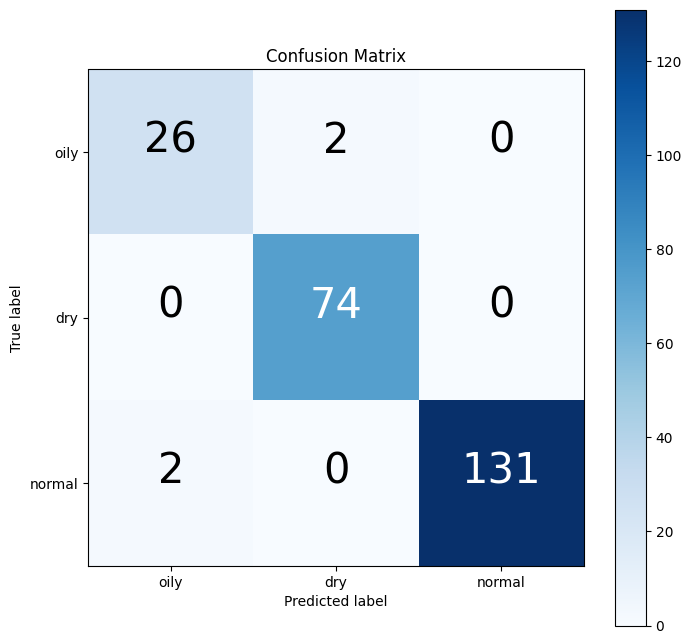

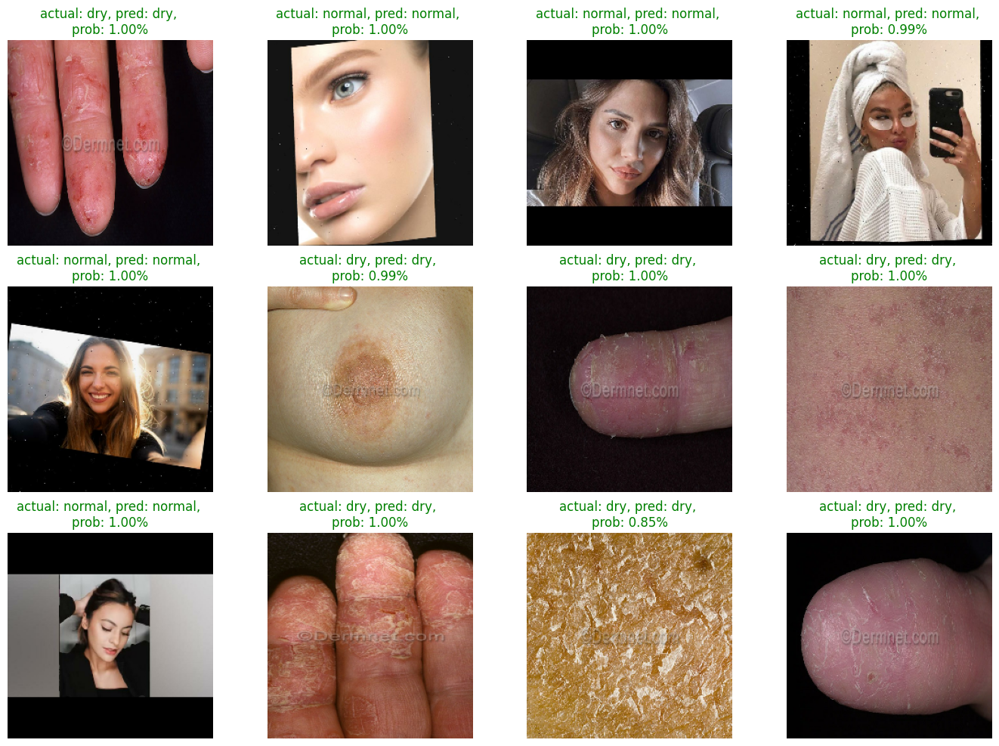

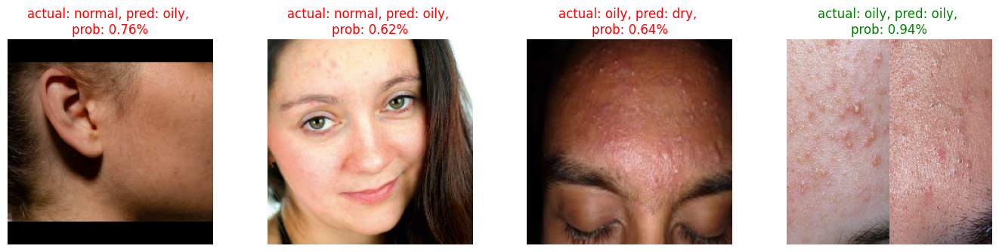

In [27]:

# Getting prediction probabilites
pred_prob = model_1.predict(test_data_shuff)
pred_prob[:20]

y_pred = pred_prob.argmax(axis=1)
y_pred[:20]

# Labels
test_data.class_indices

y_true = []
for label in test_data_labels:
    if label == "oily":
        y_true.append(0)
    elif label == "dry":
        y_true.append(1)
    elif label == "normal":
        y_true.append(2)

y_true  = np.array(y_true)
y_true[:20]

# Plotting a confusion matrix
class_names = ["oily", "dry", "normal"]

make_confusion_matrix(y_true=y_true,
                      y_pred=y_pred,
                      classes=class_names,
                      figsize=(8, 8),
                      text_size=30,
                      norm=False)

# To get suitable images
corrImgList = corrImgs(test_data_img_paths)

path_list = np.random.choice(corrImgList, size=12, replace=False)
plt.figure(figsize=(17, 12))
for i in range(12):
  img_path = path_list[i]
  class_name = img_path.split("/")[3]
  img = load_and_prep(img_path)

  pred_prob  = model_1.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred_prob.argmax()]

  # Plot the image(s)
  plt.subplot(3, 4, i+1)
  plt.imshow(img/255.)
  title_color = "g" if class_name == pred_class else "r"
  plt.title(f"actual: {class_name}, pred: {pred_class}, \nprob: {pred_prob.max():.2f}%", c=title_color)
  plt.axis(False);


# Getting test labels
test_labels = []
for path in test_data_img_paths:
  test_labels.append(path.split("/")[3])

test_labels[:5]

df_pred = pd.DataFrame({"filename" : test_data_img_paths,
                         "label": test_labels,
                         "True": y_true,
                         "pred": y_pred})

df_pred.head(10)

df_pred.to_csv("test-preds.csv")
len(test_data_img_paths)

# Wrong predicted images
wrng_pred_test_paths = []
for i in range(len(test_data_img_paths)):
  if y_true[i] != y_pred[i]:
    wrng_pred_test_paths.append(test_data_img_paths[i])

len(wrng_pred_test_paths)

# Wrongly predicted images
plt.figure(figsize=(17, 12))
for i in range(4):
  img_path = wrng_pred_test_paths[i]
  class_name = img_path.split("/")[3]
  img = load_and_prep(img_path)

  pred_prob  = model_1.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred_prob.argmax()]

  # Plot the image(s)
  plt.subplot(3, 4, i+1)
  plt.imshow(img/255.)
  title_color = "g" if class_name == pred_class else "r"
  plt.title(f"actual: {class_name}, pred: {pred_class}, \nprob: {pred_prob.max():.2f}%", c=title_color)
  plt.axis(False);

1/1 [==============================] - 0s 126ms/step


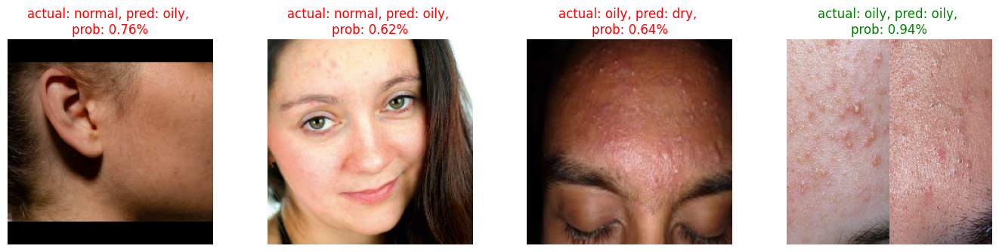

In [28]:
# Wrongly predicted images
plt.figure(figsize=(17, 12))
for i in range(4):
  img_path = wrng_pred_test_paths[i]
  class_name = img_path.split("/")[3]
  img = load_and_prep(img_path)

  pred_prob  = model_1.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred_prob.argmax()]

  # Plot the image(s)
  plt.subplot(3, 4, i+1)
  plt.imshow(img/255.)
  title_color = "g" if class_name == pred_class else "r"
  plt.title(f"actual: {class_name}, pred: {pred_class}, \nprob: {pred_prob.max():.2f}%", c=title_color)
  plt.axis(False);

In [29]:
# prompt: how many images predicted wrongly

len(wrng_pred_test_paths)


4

In [30]:
# prompt: calculate the accuracy of this model , false positive, false negative , f1 score

from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

# Calculate the accuracy
accuracy = accuracy_score(y_true, y_pred)

# Calculate the false positive rate
false_positive_rate = confusion_matrix(y_true, y_pred)[0][1] / (confusion_matrix(y_true, y_pred)[0][1] + confusion_matrix(y_true, y_pred)[0][0])

# Calculate the false negative rate
false_negative_rate = confusion_matrix(y_true, y_pred)[1][0] / (confusion_matrix(y_true, y_pred)[1][0] + confusion_matrix(y_true, y_pred)[1][1])

# Calculate the F1 score
f1 = f1_score(y_true, y_pred, average='macro')

print("Accuracy:", accuracy)
print("False Positive Rate:", false_positive_rate)
print("False Negative Rate:", false_negative_rate)
print("F1 Score:", f1)


Accuracy: 0.9829787234042553
False Positive Rate: 0.07142857142857142
False Negative Rate: 0.0
F1 Score: 0.9692207792207791


In [33]:
# Load your own image
img_path = "dr.jpg"
img = load_and_prep(img_path)

# Make a prediction
pred_prob = model_1.predict(tf.expand_dims(img, axis=0))

# Get the predicted class
pred_class = class_names[pred_prob.argmax()]

# Print the prediction
print("Predicted class:", pred_class)



1/1 [==============================] - 0s 89ms/step
Predicted class: dry
